# A Data Scientist's Approach to Understanding the Global Economy

In [1]:
import numpy as np
import pandas as pd
import pymrio
import os

## Import data

In [2]:
eora_storage = os.getcwd()+'/v199.82'
eora = pymrio.parse_eora26(year=2005, path=eora_storage)

{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [3]:
eora.get_regions()

Index(['AFG', 'ALB', 'DZA', 'AND', 'AGO', 'ATG', 'ARG', 'ARM', 'ABW', 'AUS',
       ...
       'TZA', 'USA', 'URY', 'UZB', 'VUT', 'VEN', 'VNM', 'YEM', 'ZMB', 'ZWE'],
      dtype='object', name='region', length=189)

In [4]:
eora.get_sectors()

Index(['Agriculture', 'Fishing', 'Mining and Quarrying', 'Food & Beverages',
       'Textiles and Wearing Apparel', 'Wood and Paper',
       'Petroleum, Chemical and Non-Metallic Mineral Products',
       'Metal Products', 'Electrical and Machinery', 'Transport Equipment',
       'Other Manufacturing', 'Recycling', 'Electricity, Gas and Water',
       'Construction', 'Maintenance and Repair', 'Wholesale Trade',
       'Retail Trade', 'Hotels and Restraurants', 'Transport',
       'Post and Telecommunications',
       'Finacial Intermediation and Business Activities',
       'Public Administration', 'Education, Health and Other Services',
       'Private Households', 'Others', 'Re-export & Re-import'],
      dtype='object', name='sector')

In [5]:
#!conda install -c konstantinstadler country_converter

In [6]:
N_sectors = eora.get_sectors().size
N_countries = eora.get_regions().size
print("Number of sectors: %d\nNumber of countries: %d"%(N_sectors, N_countries))

Number of sectors: 26
Number of countries: 189


## Construct total output of each country

In [7]:
eora.calc_all()

We want to find the total output of each country and plot it on a map. PyMRIO has built-in features to calculate things for us. We use the built-in aggregation features. 

In [8]:
# define concordance matrix 
sec_agg_matrix = np.ones(( 1, N_sectors), dtype = int)
reg_agg_matrix = np.eye( N_countries, dtype = int)

# aggregate
eora_agg = eora.aggregate(region_agg=reg_agg_matrix, 
                          region_names = list(eora.get_regions()),
                          sector_agg=sec_agg_matrix, 
                          sector_names = ["none", "all"], 
                          inplace = False)


In [9]:
# calculate total output
print( "Total output: %.0f Mio. USD"%float(eora_agg.x.sum()))
eora_agg.x[1::2]

Total output: 91081374564 Mio. USD


,,indout
region,sector,
AFG,all,1.297310e+07
ALB,all,1.590952e+07
DZA,all,1.739818e+08
AND,all,5.834180e+06
AGO,all,6.934051e+07
...,...,...
VEN,all,3.624088e+08
VNM,all,1.110694e+08
YEM,all,3.304288e+07


Nine trillion million dollars!

In [10]:
# clean 
x = eora_agg.x[1::2].copy()
x = x.reset_index()
x = x.drop(columns = "sector")
x["year"] = 2015


,region,indout,year
159,SUD,4.305791e+04,2015
139,MDA,5.086489e+04,2015
156,SDS,1.103574e+05,2015
174,USR,1.466048e+05,2015
145,STP,3.298809e+05,2015
...,...,...,...
178,GBR,4.139004e+09,2015
66,DEU,5.377796e+09,2015
39,CHN,6.521945e+09,2015
86,JPN,8.298199e+09,2015


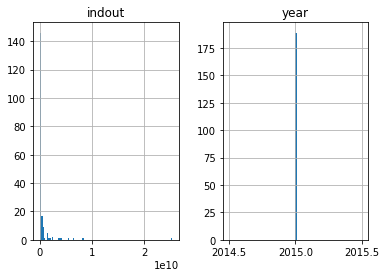

In [11]:
x.hist(bins = 100)
x.sort_values(by = ["indout"])

In [12]:
# repeat for all years
years = range(1993, 2016)
xes = []
for n, year in enumerate(years):
    print(n, year)
    eora = pymrio.parse_eora26(year=year, path=eora_storage)
    N_sectors = eora.get_sectors().size
    N_countries = eora.get_regions().size
#    eora.calc_all()
    # define concordance matrix 
    sec_agg_matrix = np.ones(( 1, N_sectors), dtype = int)
    reg_agg_matrix = np.eye( N_countries, dtype = int)
    # aggregate
    eora_agg = eora.aggregate(region_agg=reg_agg_matrix, 
                              region_names = list(eora.get_regions()),
                              sector_agg=sec_agg_matrix, 
                              sector_names = ["none", "all"], 
                              inplace = False)
    # clean 
    x = eora_agg.x[1::2].copy()
    x = x.reset_index()
    x = x.drop(columns = "sector")
    x["year"] = year
    xes.append(x)

x_years = pd.concat(xes)
    

0 1993
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


1 1994
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


2 1995
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


3 1996
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


4 1997
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


5 1998
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


6 1999
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


7 2000
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


8 2001
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


9 2002
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


10 2003
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


11 2004
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


12 2005
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


13 2006
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


14 2007
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


15 2008
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


16 2009
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


17 2010
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


18 2011
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


19 2012
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


20 2013
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


21 2014
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


22 2015
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [13]:
import country_converter as coco
cc = coco.CountryConverter()

eora_names = x_years["region"].tolist()

iso3_codes = coco.convert(names = eora_names, to='ISO3')
short_names = coco.convert(names = iso3_codes, to='name_short')
x_years["iso3"]= iso3_codes
x_years["Country"] = short_names
x_years["Total output (Mio USD)"] = x_years["indout"]

Looks like there are four countries that are not recognized but these are not important countries so we can just ignore them for now. 

In [14]:
# adding normalized output as a single column
x_years["Yearly normalized output (%)"] = x_years.groupby('year').transform(lambda x: 100*x/x.sum())["Total output (Mio USD)"]

display(x_years)
display(x_years.groupby("year").sum())

,region,indout,year,iso3,Country,Total output (Mio USD),Yearly normalized output (%)
0,AFG,4.586579e+06,1993,AFG,Afghanistan,4.586579e+06,0.010263
1,ALB,3.755675e+06,1993,ALB,Albania,3.755675e+06,0.008404
2,DZA,8.660448e+07,1993,DZA,Algeria,8.660448e+07,0.193789
3,AND,2.284331e+06,1993,AND,Andorra,2.284331e+06,0.005112
4,AGO,2.137822e+07,1993,AGO,Angola,2.137822e+07,0.047837
...,...,...,...,...,...,...,...
184,VEN,7.729572e+08,2015,VEN,Venezuela,7.729572e+08,0.507925
185,VNM,2.257143e+08,2015,VNM,Vietnam,2.257143e+08,0.148321
186,YEM,6.978590e+07,2015,YEM,Yemen,6.978590e+07,0.045858
187,ZMB,4.422794e+07,2015,ZMB,Zambia,4.422794e+07,0.029063


,indout,Total output (Mio USD),Yearly normalized output (%)
year,,,
1993,4.469001e+10,4.469001e+10,100.0
1994,4.768318e+10,4.768318e+10,100.0
1995,5.446003e+10,5.446003e+10,100.0
1996,5.660941e+10,5.660941e+10,100.0
1997,5.645557e+10,5.645557e+10,100.0
1998,5.709742e+10,5.709742e+10,100.0
1999,5.976747e+10,5.976747e+10,100.0
2000,6.214449e+10,6.214449e+10,100.0
2001,6.190783e+10,6.190783e+10,100.0


## Visualize total ouput

In [15]:
#!conda install -c plotly plotly

In [16]:
x_years.sort_values(by = "indout")

,region,indout,year,iso3,Country,Total output (Mio USD),Yearly normalized output (%)
174,USR,4.819169e+03,2013,not found,not found,4.819169e+03,0.000003
174,USR,2.470795e+04,2015,not found,not found,2.470795e+04,0.000016
174,USR,2.775497e+04,2014,not found,not found,2.775497e+04,0.000018
159,SUD,2.900890e+04,2001,not found,not found,2.900890e+04,0.000047
159,SUD,2.920514e+04,1999,not found,not found,2.920514e+04,0.000049
...,...,...,...,...,...,...,...
180,USA,2.959109e+10,2010,USA,United States,2.959109e+10,22.043942
180,USA,3.170357e+10,2014,USA,United States,3.170357e+10,20.098982
180,USA,3.191870e+10,2011,USA,United States,3.191870e+10,21.088409
180,USA,3.225090e+10,2012,USA,United States,3.225090e+10,21.042136


In [17]:
import plotly.express as px
from plotly.subplots import make_subplots

fig = px.choropleth(x_years, locations="iso3",
                    color="Total output (Mio USD)", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                   animation_frame ='year',
                   projection="natural earth",
                    range_color = [0, x_years["indout"].max()],
                   color_continuous_scale = "deep", 
                    width = 900, 
                    height = 600,
                    title = 'Total output'
)
fig.show()

fig = px.choropleth(x_years, locations="iso3",
                    color="Yearly normalized output (%)", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                   animation_frame ='year',
                   projection="natural earth",
                    range_color = [0, x_years["Yearly normalized output (%)"].max()],
                   color_continuous_scale = "deep", 
                    width = 900, 
                    height = 600,
                    title = 'Yearly normalized output'
)
fig.show()

Looks like total output grew monotonously with the exception of a dip in 2009 - the year after the financial crisis. USA appears to be the dominant player but China is catching up fast. 

## Construct flow of capital

In [18]:
# remove redundant dummy sector

T_agg = eora_agg.Z.iloc[1::2, 1::2].droplevel(level=1)
T_agg.columns = T_agg.columns.droplevel(level =1)


## Construct graph and calculate degree

Which economies are important in terms of trade? One way to go about answering this is by interpreting the economy as a directed graph with nodes that correspond to the country and (weighted) directed edges that correspond to trade between the countries. The (weighted) degree is then one measure of which countries are important.

While the degree is measure of importance it does not give an impression about which countries trade with which. For this we can use a visualization of the graph. I use Gephi because it allows interaction and produces reasonably pretty aesthetics. This requires the network to be written to .gml format and visualized seperately in Gephi, later I also write a dynamic graph to .gexf format. 


In [19]:
#!conda install -c anaconda networkx
import networkx as nx

In [20]:
# Construct graph for interactiveness in Gephi

# Set the diagonals to be zero to be able to identify the trade between countries
# Otherwise the domestic trade (self-edges) will dominate
for n in range(T_agg.shape[0]): # NOT elegant
    T_agg.iloc[n, n] = 0.0

G = nx.from_pandas_adjacency(T_agg,create_using=nx.MultiDiGraph)

G.edges(data=True)

# save graph 
nx.write_gml(G, "G.gml")  

# convert back to dictionary
G_deg = dict(G.degree(weight='weight'))

# convert to DataFrame
G_df = pd.DataFrame(G_deg, index =["Degree"]).T
# fix Sudan and South Sudan
as_list = G_df.index.tolist()
idx = as_list.index('SUD')
as_list[idx] = 'SDN'
idx = as_list.index('SDS')
as_list[idx] = 'SSD'

G_df.index = as_list


#Convert name to make readable
eora_names = G_df.index.tolist()

iso3_codes = coco.convert(names = eora_names, to='ISO3')

short_names = coco.convert(names = iso3_codes, to='name_short')

G_df["iso3"]= iso3_codes

G_df["Country"] = short_names

## plot histogram of degrees
#G_df.hist(bins = 100)

# plot degree on world map
fig = px.choropleth(G_df, locations="iso3",
                    color="Degree", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
#                   animation_frame ='year',
                   projection="natural earth",
                    range_color = [0,G_df["Degree"].max()],
                   color_continuous_scale = "deep", 
                    width = 900, 
                    height = 600,
                    title = 'Degree'
)
fig.show()



In [21]:
# Check direction of arrows in Gephi
print(T_agg.loc["ALB", "AFG"])
print(T_agg.loc["AFG", "ALB"])
display(T_agg)

print(T_agg[["USA", "CHN"]].loc[["USA", "CHN"]])



1569.4328050000001
260.77888


region,AFG,ALB,DZA,AND,AGO,ATG,ARG,ARM,ABW,AUS,...,TZA,USA,URY,UZB,VUT,VEN,VNM,YEM,ZMB,ZWE
region,,,,,,,,,,,,,,,,,,,,,
AFG,0.000000,260.778880,410.985642,169.662315,381.471944,126.923799,1067.572067,231.927731,280.633775,1.723682e+03,...,296.181499,2.442334e+03,628.918422,1288.192147,220.473486,998.313336,1034.758264,388.320627,313.182101,99.371581
ALB,1569.432805,0.000000,679.484780,349.608521,846.304080,255.060787,1982.400800,505.644869,602.345318,3.418984e+03,...,500.424391,1.375731e+04,1083.860296,2811.983342,469.392466,2143.512495,3028.798728,838.095051,671.882603,166.299825
DZA,409.514925,315.786350,0.000000,238.341888,556.030362,187.065947,14871.020178,328.433398,378.548434,5.251090e+03,...,380.727188,1.047216e+07,948.340139,1931.590156,316.242110,1407.063844,1587.827859,505.386569,457.032113,207.843429
AND,402.205870,384.305786,1816.122229,0.000000,561.444239,173.593634,1302.529598,342.093969,393.955864,2.950599e+03,...,422.019854,2.439616e+03,738.451391,1834.961984,315.178319,1523.565097,1400.182477,579.156627,420.446477,109.408617
AGO,721.202307,665.732977,825.718531,426.023904,0.000000,318.097389,7511.432804,575.307560,711.578176,3.564822e+03,...,709.234105,6.374152e+06,1473.253694,3379.619341,554.667572,2157.571186,3028.150891,933.770190,827.732094,331.216080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VEN,1515.984262,1183.935295,1604.241856,883.441338,2185.116138,3582.130010,60447.051544,1264.299627,156277.548544,1.041280e+04,...,2536.505772,8.030618e+07,62534.147914,6851.035707,949.109140,0.000000,6141.070700,1989.173481,1900.824751,783.120501
VNM,1600.976981,1395.051905,13584.991760,985.551383,11864.593302,785.207384,13099.153929,1262.454357,1573.889711,1.066320e+06,...,6167.902285,3.934373e+05,3308.203576,7636.252877,1426.691864,6863.135716,0.000000,3488.704224,1610.010996,460.362830
YEM,320.889199,293.016070,403.266550,189.398391,468.978790,140.565832,1485.992205,268.905119,303.735959,2.862406e+04,...,474.865394,9.868511e+04,3191.685698,1586.489021,246.913812,1249.668484,1204.131638,0.000000,356.924193,104.821413


region           USA           CHN
region                            
USA     0.000000e+00  9.470438e+07
CHN     1.687411e+08  0.000000e+00


## Hierachical clustering 

Visual inspection reveals that the network is well connected. To make sense of the global economy it makes sense to perform clustering to determine if the global economies can be understood in terms of clusters of countries. To perform the clustering, it is necessary to introduce a single distance metric. This effectively turns the graph from a directed graph into an undirected graph. As distance measure we can use the average weight of the two edges connecting each node. 

In [22]:
T_agg2 = eora_agg.Z.iloc[1::2, 1::2].droplevel(level=1)
T_agg2.columns = T_agg2.columns.droplevel(level =1)
# Define 1/T as intermediate distance
T_inv = 1/T_agg2

# T_inv is not symmetric because import and export is not the same
# Make distance symmetric by taking average of import and export

T_dist = (T_inv + T_inv.transpose())/2

# set the diagonals to be zero to be able to identify the trade between countries
for n in range(T_dist.shape[0]): # NOT elegant
    T_dist.iloc[n, n] = 0.0

# Construct graph for adjacency measures
G_dist = nx.from_pandas_adjacency(T_dist,create_using=nx.MultiDiGraph)


In [23]:
#!conda install -c anaconda scipy
#!conda install -c intel scikit-learn
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import complete, average, single, cut_tree
from sklearn.metrics import silhouette_score
from matplotlib import pylab as plt

We can then perform hierarchical clustering using a few different linkage types. 

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:356: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



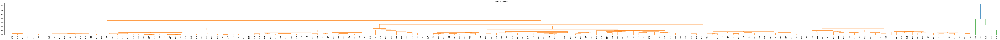

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:438: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



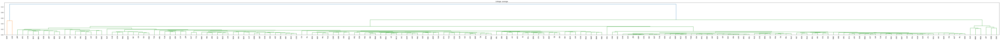

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:274: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



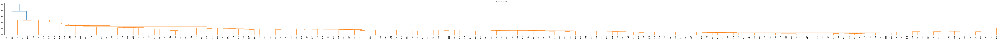

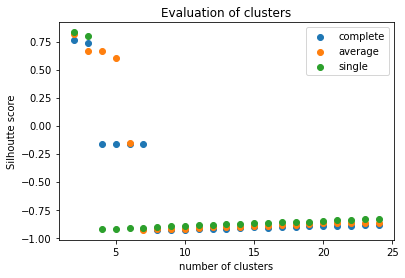

In [24]:
# maximum number of clusters
MAX_CLUSTERS = 25


# placeholder for trees
trees = {}

linkages = ['complete', 'average', 'single']

for linkage in linkages:

    if linkage == 'complete':
        
        linkage_matrix = complete(T_dist)

    elif linkage == 'average':

        linkage_matrix = average(T_dist)

    elif linkage == 'single':

        linkage_matrix = single(T_dist)

    trees[linkage] = linkage_matrix
    
    plt.figure(figsize = (150,5))
    
    dendrogram(linkage_matrix, labels = list(T_dist.keys()), leaf_rotation = 90, leaf_font_size = 12 )
    
    plt.title('Linkage: %s'%linkage)
    plt.show()
    plt.close()
    
    
# Cut the tree to get a predefined number of clusters and compute clustering score

clustering_scores = pd.DataFrame()


pred_clusters = {}

for linkage in linkages:

    # loop over number of clusters
    for n_clusters in range(2, MAX_CLUSTERS):

        metrics_results = {}

        linkage_matrix = trees[linkage]

        results = {}

        clusters = cut_tree(linkage_matrix, n_clusters=n_clusters)

        pred_clusters["%s_%d"%(linkage, n_clusters)] = clusters

        results['clustering'] = linkage
        results['n_clusters'] = n_clusters
        results['silhouette'] = silhouette_score(T_dist, clusters[:,0], metric = 'precomputed')
        item = pd.DataFrame(results, index=[0])
        G_df["%s_%d"%(linkage, n_clusters)] = clusters

        clustering_scores = pd.concat([clustering_scores, item])

#        Calinski-Harabasz Index
#Davies-Bouldin Index        
## Plot the scores
for linkage in linkages:

    cond = (clustering_scores['clustering']==linkage)
    
    
    data = clustering_scores[cond]
    
    x = data['n_clusters'].values
    
    y = data["silhouette"].values
#    sns.set()
    
    plt.scatter(x,y, label=linkage)
#    plt.axvline(x=17)
plt.title("Evaluation of clusters")
plt.xlabel('number of clusters')
plt.ylabel('Silhoutte score')
plt.legend()
plt.show()


I also tried DBSCAN but didn't really get anything meaningful. 

There is no single maximum for the silhoutte score. In fact, negative scores are seen for >3 to >5 clusters which indicates overlapping. We can also see that single linkage gives dendrograms where the "outliers" are more or less added sequentially to the same cluster as the tree is traversed. Average and complete linkage looks more promising. 

## Visualizing clusters

We could visualize the clusters usind MDS or on a world map. 

In [25]:
from sklearn.manifold import MDS
import seaborn as sb


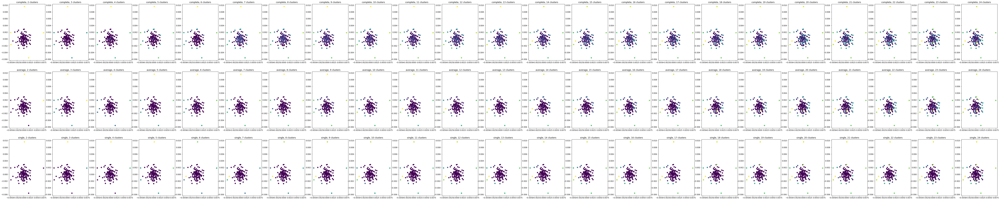

In [26]:
sb.reset_orig()

# plot all clustering results
fig, axs = plt.subplots(len(linkages),MAX_CLUSTERS-2, figsize = (100, 20))

# for reproducibility
seed = np.random.RandomState(seed=26)

embedding = MDS(n_components = 2 ,
                dissimilarity = 'precomputed',
                random_state = seed)

X = embedding.fit_transform(T_dist.values)

for n, linkage in enumerate(linkages): 

    for m, n_clusters in enumerate(range(2, MAX_CLUSTERS)):
    
        predicted_cluster_nm = pred_clusters["%s_%d"%(linkage,n_clusters)]            
        axs[n,m].scatter(X[:, 0], X[:, 1], c=predicted_cluster_nm )
        #        axs[n,m].scatterplot(x=X[:, 0], y= X[:, 1], hue=pred_clusters["%s_%d"%(linkage,n_clusters)])
        axs[n,m].set_title("%s, %d clusters"%(linkage, n_clusters))



USR    3
Name: complete_4, dtype: int64

Index(['AFG', 'ALB', 'DZA', 'AND', 'AGO', 'ATG', 'ARG', 'ARM', 'ABW', 'AUS',
       ...
       'TZA', 'USA', 'URY', 'UZB', 'VUT', 'VEN', 'VNM', 'YEM', 'ZMB', 'ZWE'],
      dtype='object', length=189)

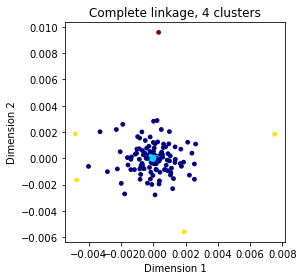

In [27]:
sb.reset_orig()
cs = 4
linkage = 'complete'
plt.figure()
predicted_cluster_nm = pred_clusters["%s_%d"%(linkage,cs)]            
display(G_df["%s_%d"%(linkage,cs)][G_df["%s_%d"%(linkage,cs)]==3])

plt.scatter(X[:, 0], X[:, 1], c=predicted_cluster_nm , s = 14, cmap = 'jet')
#        axs[n,m].scatterplot(x=X[:, 0], y= X[:, 1], hue=pred_clusters["%s_%d"%(linkage,n_clusters)])
plt.title("%s linkage, %d clusters"%('Complete', cs))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.gca().set_aspect(1./plt.gca().get_data_ratio())
#axes.set_aspect(1./axes.get_data_ratio())
plt.tight_layout()
plt.savefig('cluster_MDS.png')
G_df.index



It looks like the global economy is very well connected but that there is a strong core of economomies around which the the rest of the world is centered. With complete linkage, the cluster is visible in the center from from four clusters. For average linkage, it is seen from 6 clusters. It is a little difficult to see in this drawing. Perhaps is easier if we visualize the clustering along with a visualization of the network. 

In [28]:
import plotly.graph_objs as go


cols_dd =list(G_df.columns)[3:]
# we need to add this to select which trace 
# is going to be visible
visible = np.array(cols_dd)

# define traces and buttons at once
traces = []
buttons = []
for value in cols_dd:
    traces.append(go.Choropleth(
        colorscale = "jet",
       locations=G_df['iso3'], # Spatial coordinates
        z=G_df[value].astype(str), # Data to be color-coded
        visible= True if value==cols_dd[0] else False))

    buttons.append(dict(label=value,
                        method="update",
                        args=[{"visible":list(visible==value)},
                              {"title":f"<b>{value}</b>"}]))

updatemenus = [{"active":0,
                "buttons":buttons,
               }]


# Show figure
fig = go.Figure(data=traces,
                layout=dict(updatemenus=updatemenus))
# This is in order to get the first title displayed correctly
first_title = cols_dd[0]
fig.update_layout(title=f"<b>{first_title}</b>",title_x=0.5)
fig.show()



It appears that the global economy truly is global. There are apparent outsiders like Somalia and Moldova which are poorly connected to the rest of the world. The rest of the world can be divided into a blue and a red team. The red team consists of most of Africa, Central America, the Middle East and a series of smaller economies around the world. The blue team consists of the rest of the world. 

## Identifying interesting interactions

We used MDS to get a sense of the relative position of each economy compared to each other. But we cannot identify local effects interactions from that. To identify local effects, we can plot the economy as a dynamic directed graph using a spring algorithm. 

In [29]:
# Get nodes and edges for all years
years = range(1993, 2016) #[2014, 2015]#

nodes_years = {}
edges_years = {}

graphs = []
for n, year in enumerate(years):
    print(n, year)
    eora = pymrio.parse_eora26(year=year, path=eora_storage)
    N_sectors = eora.get_sectors().size
    N_countries = eora.get_regions().size
#    eora.calc_all()
    # define concordance matrix 
    sec_agg_matrix = np.ones(( 1, N_sectors), dtype = int)
    reg_agg_matrix = np.eye( N_countries, dtype = int)
    # aggregate
    eora_agg = eora.aggregate(region_agg=reg_agg_matrix, 
                              region_names = list(eora.get_regions()),
                              sector_agg=sec_agg_matrix, 
                              sector_names = ["none", "all"], 
                              inplace = False)
    # clean 
    # remove redundant sector
    T_agg = eora_agg.Z.iloc[1::2, 1::2].droplevel(level=1)
    T_agg.columns = T_agg.columns.droplevel(level =1)
    
    # set the diagonals to be zero to be able to identify the trade between countries
    for n in range(T_dist.shape[0]): # NOT elegant
        T_agg.iloc[n, n] = 0.0
    
    G = nx.from_pandas_adjacency(T_agg.T,create_using=nx.MultiDiGraph) # transpose to ensure direction of arrow follows direction of money
    graphs.append(G)
#    G.edges(data=True)
    
    # convert back to dictionary
#    nodes_years[year] = dict(G.degree(weight='weight'))
#    edges_years[year] = list(G.edges(data=True))


0 1993
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



1 1994
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



2 1995
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



3 1996
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



4 1997
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



5 1998
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



6 1999
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



7 2000
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



8 2001
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



9 2002
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



10 2003
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



11 2004
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



12 2005
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



13 2006
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



14 2007
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



15 2008
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



16 2009
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



17 2010
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



18 2011
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



19 2012
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



20 2013
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



21 2014
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



22 2015
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



With this dynamic map we can write the graph to a format that can be recognized by Gephi. 

In [30]:
# write a function to export graph as .gexf file which can be visualized with Gephi

def write_list_of_networkX_graphs_to_gexf(graphs, timestamps, savename = "nx2gexf.gexf"):
    """Write  a list of networksX graphs with weighted edges and nodes to a dynamic .gexf file.
    Each element in the list corresponds to a timestamp.
    graphs: list of networkx graphs
    timestamps: list of timestampt integers or floats.
    Returns: None
    """
    # import date
    from datetime import date

    # create composed graph (time-limiting step)
    graph_comp = nx.compose_all(graphs)
    
    #initialize dictionary that links edges to timestamps and nodes to timestamps
    from collections import defaultdict    
    edge2timestamps = defaultdict(list)
    node2timestamps = defaultdict(list)
    
    #initialize dictionary of dictionary that links nodes, year and degree
    node2deg = defaultdict(lambda: defaultdict(float))
    

    #populate composed graph and dictionaries
    for n, graph_n in enumerate(graphs):

        #add edge data        
        for edge in graph_n.edges(data=True):
            graph_comp.add_edge(edge[0],edge[1],key=timestamps[n],weight=edge[2]["weight"])                
            edge2timestamps[(edge[0], edge[1])].append(timestamps[n])
        
        # add nodes data
        degrees = graph_n.degree(weight = "weight")
        for node in graph_n.nodes:
            node2timestamps[node].append(timestamps[n])
            node2deg[node][timestamps[n]]=degrees[node]
    
    # get sorted list of unique nodes
    nodes = sorted(list(set(list(graph_comp.nodes))))
    
    # create dictionary that links node to integer
    node2id = {node_n:n for n, node_n in enumerate(nodes)}
   
    # Create string which will eventually be written to file
    s = "" 
    
    # add header info
    s+="""<?xml version="1.1" encoding="UTF-8"?>
<gexf xmlns="http://www.gexf.net/1.2draft" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" xsi:schemaLocation="http://www.gexf.net/1.2draft http://www.gexf.net/1.2draft/gexf.xsd" version="1.2">
\t<meta lastmodifieddate={date}>
\t\t<creator>Anders Borges</creator>
\t\t<description>A dynamic graph of region-aggregated intermediate demand matrix from EORA26</description>
\t</meta>
\t<graph mode="dynamic" defaultedgetype="directed" timeformat="double"> \n""".format(
                        date = '"%s"'%date.today())

    # declare attributes
    s += ("""\t\t<attributes class="node" mode="dynamic">
\t\t\t<attribute id="0" title="Label" type="string"/>
\t\t\t<attribute id="wdeg" title="weighted degree" type="float"/>
\t\t</attributes>
\t\t<attributes class="edge" mode="dynamic">
\t\t\t<attribute id="weight" title="Weight" type="float"/>
\t\t</attributes>\n""") 

    #add nodes
    s+="""\t\t<nodes>\n"""

    for n, node in enumerate(nodes):

        s+= """\t\t\t<node id="{idx}" label="{label}">\n""".format(
                                idx = node2id[node],
                                label = node)
                                          
        for n, timestamp_n in enumerate(node2timestamps[node]):
            s+="""\t\t\t\t<attvalue for="wdeg" value="{deg_t_n}" start="{start}" end="{end}"> </attvalue>\n""" \
                .format(deg_t_n=node2deg[node][timestamp_n], 
                       start=timestamp_n, 
                       end = timestamp_n+1)
                                          
        s+="\t\t\t</node>\n"
                                          
    s+="\t\t</nodes>\n"
    
    # add edges                                          
    s+="\t\t<edges>\n"

    for e, edge_n in enumerate(list(edge2timestamps.keys())): 
                                          
        s+="""\t\t\t<edge source="{source_idx}" target="{target_idx}">\n\t\t\t\t<attvalues>\n""" \
            .format(source_idx = node2id[edge_n[0]], 
                   target_idx = node2id[edge_n[1]])
                                          
        # loop over each timestamp
        for n, timestamp_n in enumerate(edge2timestamps[(edge_n[0], edge_n[1])]):
                                          
            weight_t_n = graph_comp[edge_n[0]][edge_n[1]][timestamp_n]['weight']
                                          
            s+="""\t\t\t\t\t<attvalue for="weight" value="{weight_t_n}" start="{start}" end="{end}"> </attvalue>\n""" \
            .format(weight_t_n ="%.1f"%(weight_t_n/100), 
                   start="%.1f"%timestamp_n,
                    end = "%.1f"%(timestamp_n+1))
        
        s+="\t\t\t\t</attvalues> \n \t\t\t</edge>\n"
        
    s+="\t\t</edges>\n"
        
    # tags to close graph and gexf 
    s +=("\t</graph>\n</gexf>")

    # write to file  gephi
    
    with open(savename, "w") as f:                                          
        f.write(s)    
                                          
    return 


# call function 

write_list_of_networkX_graphs_to_gexf(graphs, years, savename= "T_1993-2015.gexf")


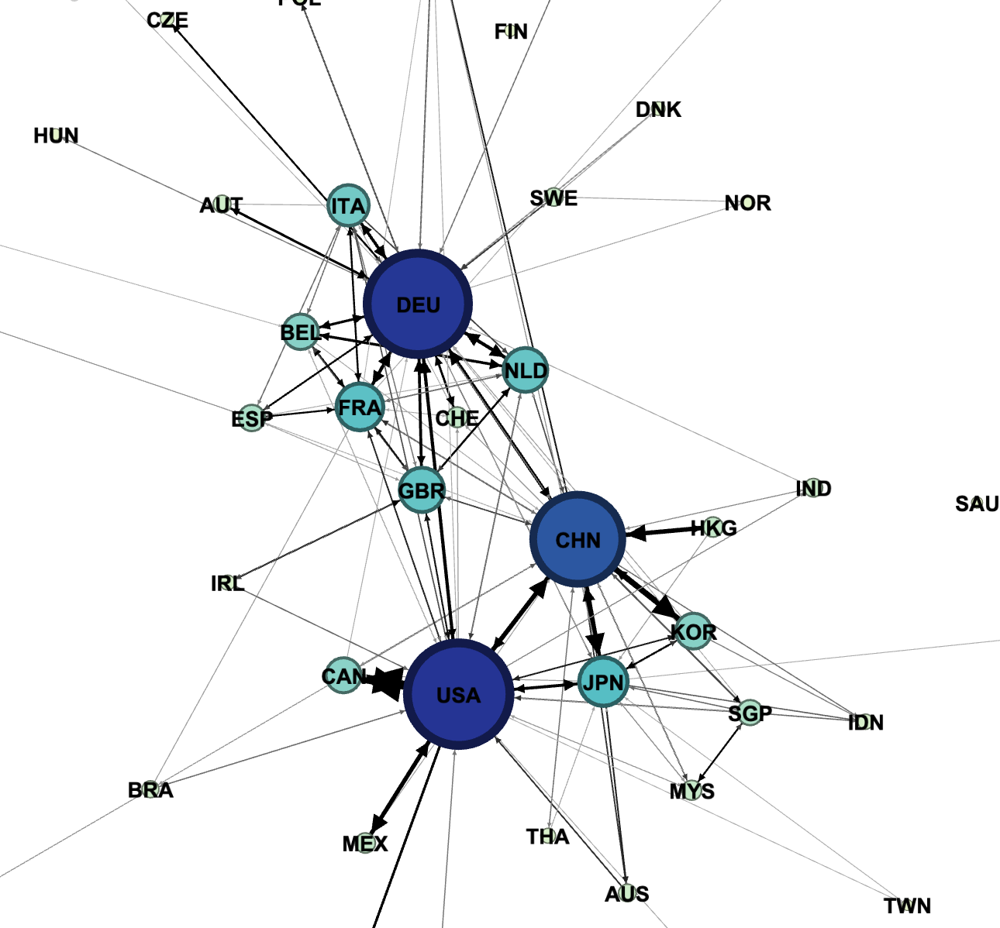

In [31]:
from IPython.display import Image
Image(filename='2014.png') 

The figure is a representation of the T matrix. The edges correspond to off-diagonal elements and the nodes represent the sum of the off-diagonal elements. The direction of the edges follows the transaction of money. The color and size/width of the arrows correspond to the magnitude of the corresponding element in the T matrix. The larger the element, the blacker and larger the arrow. The size and color of the nodes correspond to the weighted degree of the node. This can be understand as the sum of all the trade in and out the country. Trade within the country is not included (self-loops) because it would dominate the picture. The position of the nodes is calculated using a spring model. Each edge is modelled as spring, the stiffness of which is proportional to the edge weight. Furthermore, the nodes are modelled as electrical charges of the same sign such that nodes that are close together, repel each other more than nodes that further apart. The system is initialized with random positions and allowed to relaxe until the nodes do not move. The relative distance between thenodes therefore indicate how strongly they are connected but there is no meaning in the concepts of north, south, east or west (the system is rotation invariant).  

We can see that there appears to be three major hubs of trade in the global economy: USA, Germany (DEU) and China. Germany is apparently a trade hub for the rest of EU. A lot of trade appears to be happening between Canada and USA. China and USA appear to be more connected to countries in Asia than the EU. Lots of patterns can be deducted from this picture. 

We can do the same for the sectors. 

## Visualize sectors

First we aggregate:

In [32]:
# define concordance matrix 

print(N_sectors)
print(N_countries)
sec_agg_matrix2 = np.eye(N_sectors, dtype = int)
reg_agg_matrix2 = np.ones((1, N_countries), dtype = int)

# aggregate countries
eora_agg_sec = eora.aggregate(region_agg=reg_agg_matrix2, 
                          region_names = ["none", "all"],
                          sector_agg=sec_agg_matrix2, 
                          sector_names = list(eora.get_sectors()), 
                          inplace = False)

26
189


Agriculture                       Agriculture                                        6.228060e+08
                                  Fishing                                            2.317987e+07
                                  Mining and Quarrying                               3.227506e+06
                                  Food & Beverages                                   1.595382e+09
                                  Textiles and Wearing Apparel                       1.462427e+08
                                                                                         ...     
Consumption of fixed capital K.1  Non-profit institutions serving households P.3n    0.000000e+00
                                  Government final consumption P.3g                  0.000000e+00
                                  Gross fixed capital formation P.51                 0.000000e+00
                                  Changes in inventories P.52                        0.000000e+00
                    

<AxesSubplot:xlabel='sector'>

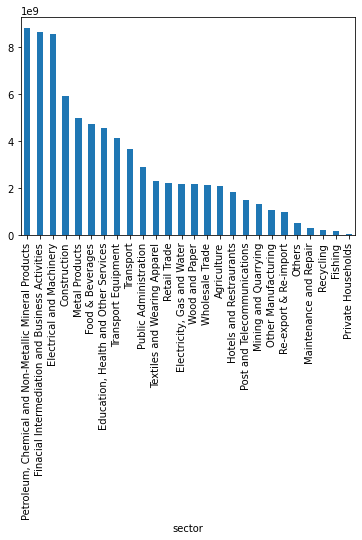

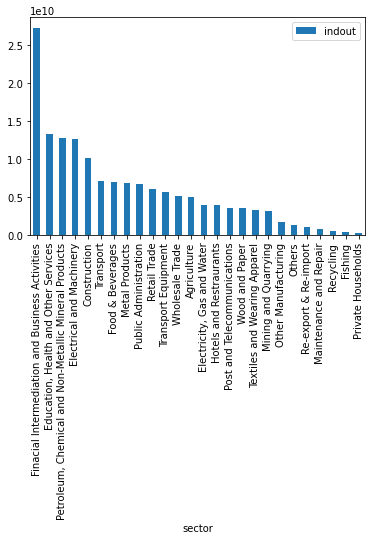

In [33]:
# clean up
T_sec=eora_agg_sec.Z["all"].loc["all"]
x_sec=eora_agg_sec.x.loc["all"]
Y_sec = eora_agg_sec.Y["all"].loc["all"]
VA_sec = eora_agg_sec.VA.F["all"].droplevel(0)
full_economy =pd.concat([pd.concat([T_sec, Y_sec], axis=1), VA_sec], axis = 0).fillna(0).stack()
full_economy.columns = ['source', 'target', 'weight']

#full_economy = full_economy[full_economy['weight'] != 0]  # remove non-connected nodes

#g = nx.from_pandas_edgelist(df, 'source', 'target', ['weight'])

display(full_economy)
#print(list(VA_sec.itertuples()))
# plot bar chart of column sums
T_sec.sum().sort_values(ascending=False).plot.bar()
x_sec.sort_values(by = "indout", ascending=False).plot.bar()

#G_sec_test = nx.from_pandas_adjacency(full_economy.T,create_using=nx.MultiDiGraph) # transpose to follow money
#G_sec_test
#nx.write_gml(G_sec_test, "G_sec_test.gml")  

Oil/chemical/mining, financial institutions and heavy machinery dominates the trade between sectors in the global economy. Education, Health and Other Services has a large output. 

<AxesSubplot:>

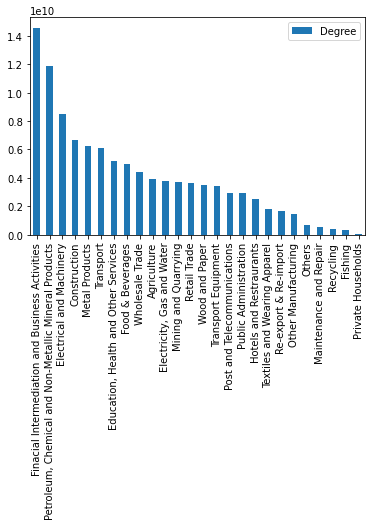

In [34]:
# Define 1/T as intermediate distance
T_inv_sec = 1/T_sec

# T_sec is not symmetric because import and export is not the same
# Make distance symmetric by taking average of import and export

T_dist_sec = (T_inv_sec + T_inv_sec.transpose())/2

# set the diagonals to be zero to be able to identify the trade between countries
for n in range(T_dist_sec.shape[0]): # NOT elegant
    T_dist_sec.iloc[n, n] = 0.0


# Construct graph for adjacency measures
G_dist_sec = nx.from_pandas_adjacency(T_dist_sec,create_using=nx.MultiDiGraph)

# set the diagonals to be zero to be able to identify the trade between countries
for n in range(T_dist_sec.shape[0]): # NOT elegant
    T_sec.iloc[n, n] = 0.0

G_sec = nx.from_pandas_adjacency(T_sec.T,create_using=nx.MultiDiGraph) # transpose to follow money

G_sec.edges(data=True)

# save graph 
nx.write_gml(G_sec, "G_sec.gml")  

# convert back to dictionary
G_deg_sec = dict(G_sec.degree(weight='weight'))


# convert to DataFrame
G_df_sec = pd.DataFrame([G_deg_sec], index =["Degree"]).T

## plot histogram of degrees
G_df_sec.sort_values(by="Degree", ascending=False).plot.bar()



## Clustering of industries

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:356: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



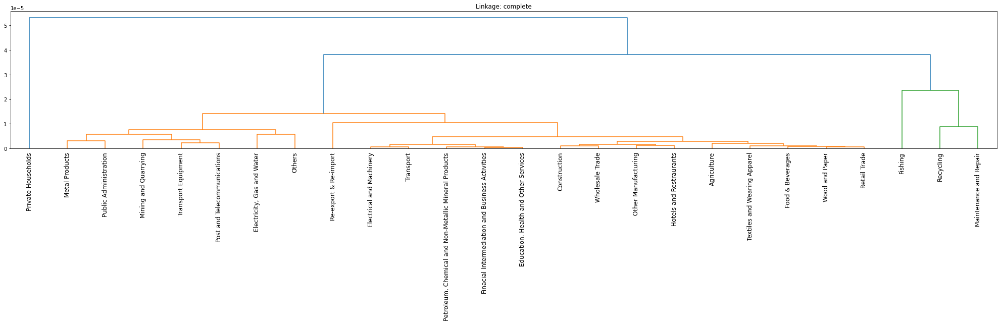

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:438: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



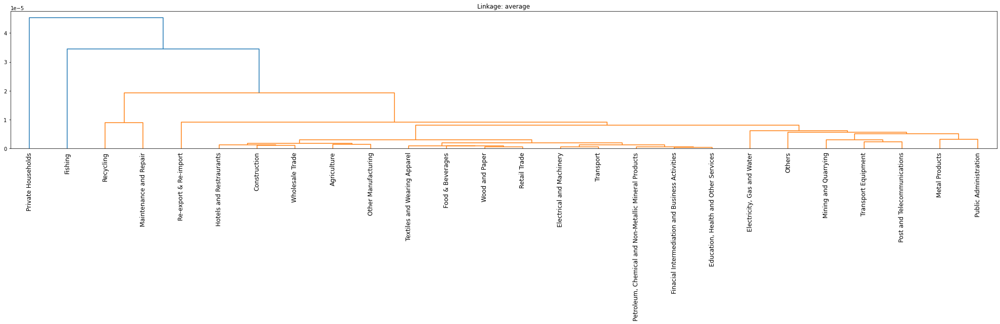

/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:274: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



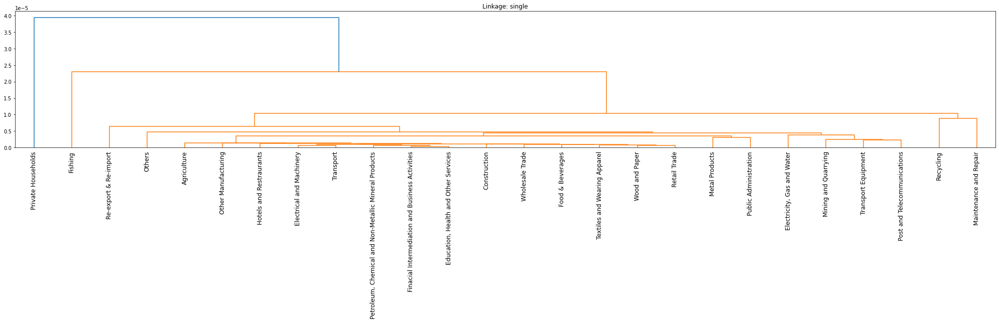

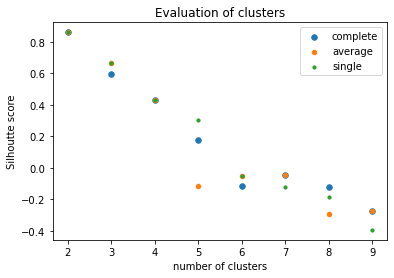

In [35]:
# maximum number of clusters
MAX_CLUSTERS = 10


# placeholder for trees
trees_sec = {}

linkages = ['complete', 'average', 'single']

for linkage in linkages:

    if linkage == 'complete':
        
        linkage_matrix = complete(T_dist_sec)

    elif linkage == 'average':

        linkage_matrix = average(T_dist_sec)

    elif linkage == 'single':

        linkage_matrix = single(T_dist_sec)

    trees_sec[linkage] = linkage_matrix
    
    plt.figure(figsize = (35,5))
    
    dendrogram(linkage_matrix, labels = list(T_dist_sec.keys()), leaf_rotation = 90, leaf_font_size = 12 )
    
    plt.title('Linkage: %s'%linkage)
    plt.show()
    plt.close()
    
    
# Cut the tree to get a predefined number of clusters and compute clustering score

clustering_scores_sec = pd.DataFrame()


pred_clusters_sec = {}

for linkage in linkages:

    # loop over number of clusters
    for n_clusters in range(2, MAX_CLUSTERS):

        metrics_results = {}

        linkage_matrix = trees_sec[linkage]

        results = {}

        clusters = cut_tree(linkage_matrix, n_clusters=n_clusters)

        pred_clusters_sec["%s_%d"%(linkage, n_clusters)] = clusters

        results['clustering'] = linkage
        results['n_clusters'] = n_clusters
        results['silhouette'] = silhouette_score(T_dist_sec, clusters[:,0], metric = 'precomputed')

        item = pd.DataFrame(results, index=[0])

        clustering_scores_sec = pd.concat([clustering_scores_sec, item])

        
# Plot the scores
for n, linkage in enumerate(linkages):

    cond = (clustering_scores_sec['clustering']==linkage)
        
    data = clustering_scores_sec[cond]
    
    x = data['n_clusters'].values
    
    y = data["silhouette"].values
#    sns.set()
    
    plt.scatter(x,y, label=linkage, s = 30-10*n)
#    plt.axvline(x=17)
plt.title("Evaluation of clusters")
plt.xlabel('number of clusters')
plt.ylabel('Silhoutte score')
plt.legend()
plt.show()


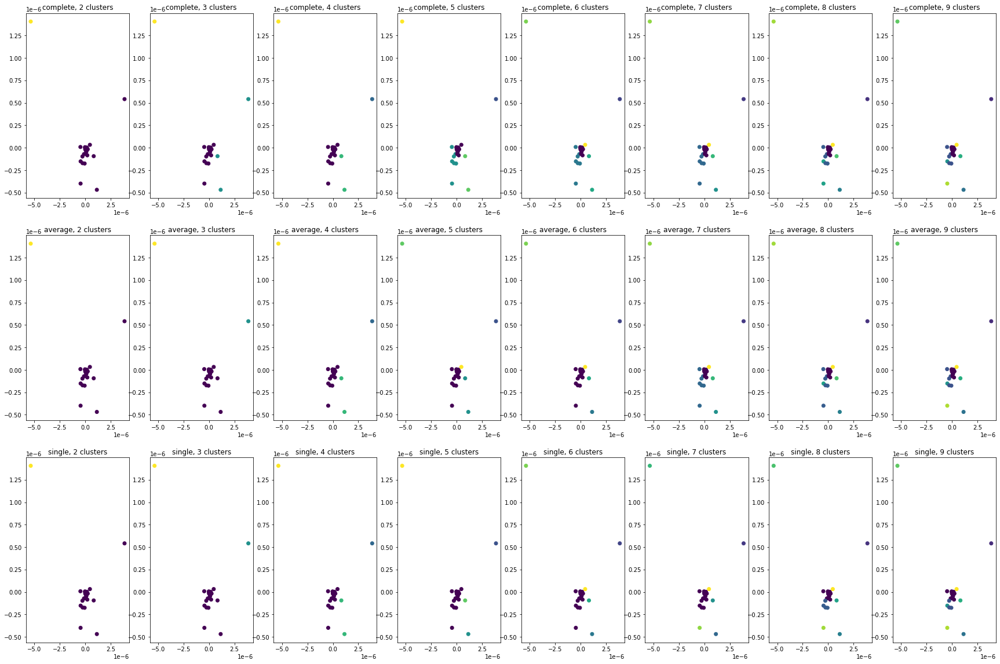

In [36]:
# for reproducibility
seed = np.random.RandomState(seed=26)

# plot all clustering results
fig, axs = plt.subplots(len(linkages),MAX_CLUSTERS-2, figsize = (30, 20))
embedding = MDS(n_components = 2 ,
                dissimilarity = 'precomputed',
                random_state = seed)

X = embedding.fit_transform(T_dist_sec.values)

for n, linkage in enumerate(linkages):

    for m, n_clusters in enumerate(range(2, MAX_CLUSTERS)):
    

        axs[n,m].scatter(X[:, 0], X[:, 1], c=pred_clusters_sec["%s_%d"%(linkage,n_clusters)])
        axs[n,m].set_title("%s, %d clusters"%(linkage, n_clusters))

        

Four of the sectors are apparently quite isolated from the rest. These are "Others", "Fishing", "Maintenance and Repair" and "Recycling". The rest fairly well connected. We can also look at the visualization of the corresponding graph:

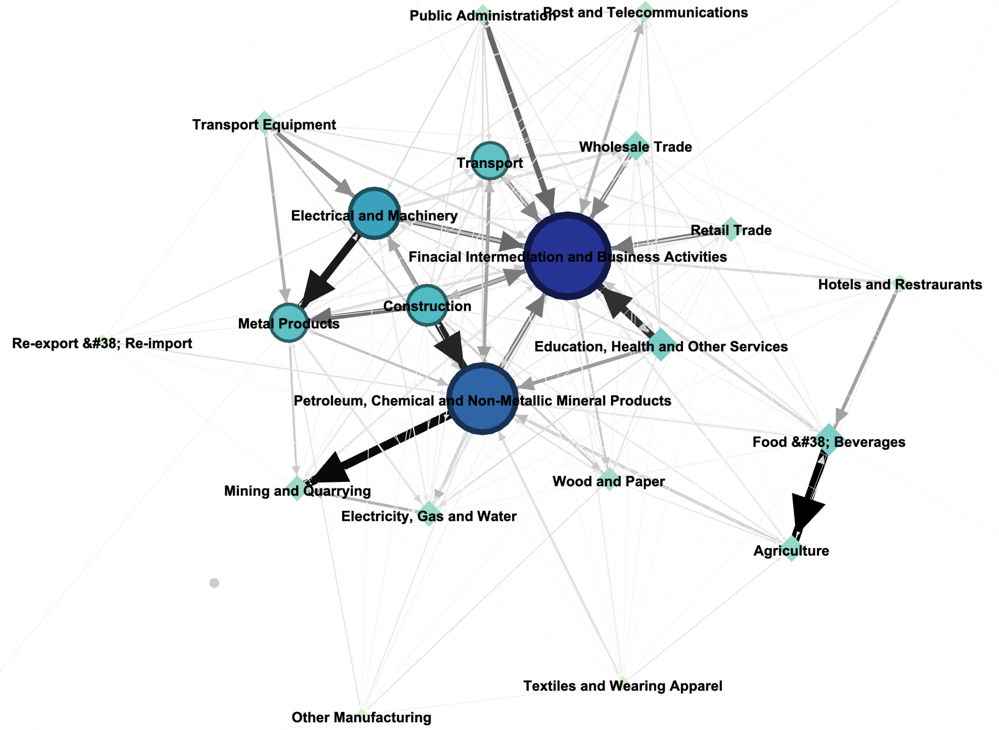

In [37]:
from IPython.display import Image
Image(filename='Sectors 2014.png') 

You can clearly distinguish certain supply chains like "Mining and Quarring"-> "Petroleum, Chemical.."->"Construction" and "Agriculture"->"Food and Beverage"-> "Hotels and Restaurants". But the core center of the global economony is "Financial Intemediation and Business Activities".  

## What shapes the economy?

We first look at a few of the different matrices. 

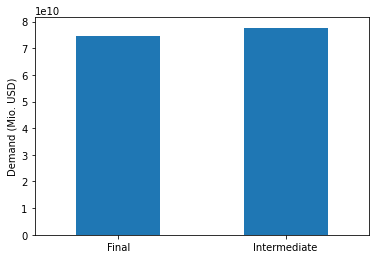

In [38]:
# get data
eora_agg_sec.calc_all()
T_sec=eora_agg_sec.Z["all"].loc["all"]
x_sec=eora_agg_sec.x.loc["all"]
A_sec = eora_agg_sec.A["all"].loc["all"]
L_sec = eora_agg_sec.L["all"].loc["all"]
q = eora_agg_sec.Q.S.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']['all']
Q =eora_agg_sec.Q.F.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']['all']
D_cba = eora_agg_sec.Q.D_cba.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']['all']


# bar chart: x decomposed into T and y
Y_sec = eora_agg_sec.Y["all"].loc["all"]
x_sec["Final"]= Y_sec.sum(axis =1)
x_sec["Intermediate"] = T_sec.sum(axis = 1)
x_sec.iloc[:,1:].sum(axis =0).plot.bar(y=["Final", "Intermediate"])
plt.ylabel("Demand (Mio. USD)")
plt.xticks(rotation =0)
plt.savefig('Demand2015.png')
plt.show()




We see that the total economy is driven by approximately equal amounts of final demand and intermediate demand. We can break this down into the individual sectors to see the variation within sectors.  

<AxesSubplot:xlabel='sector'>

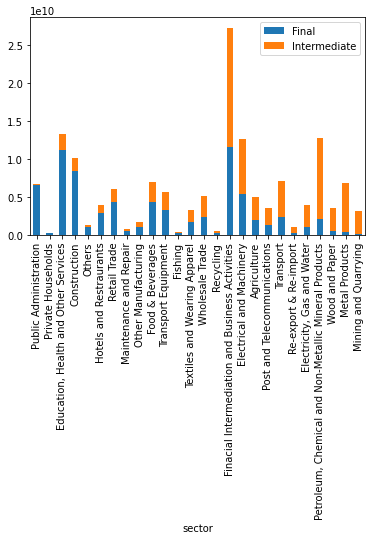

In [39]:
# sort sectors by ratio of indirect and direct output
x_sec["Interm./Total Demand"] = x_sec["Intermediate"]/x_sec["indout"]

x_sec.sort_values(by="Interm./Total Demand").plot.bar(y = ["Final", "Intermediate"], stacked= True)
#x_sec

We see that primary sectors are driven mostly by intermediate demand while public sectors and secondary and tertiary sectors rely more on final demand. The number is different for each industry, for example for "Mining and Quarrying" the demand is almost entirely intermediate and for "Construction" the demand is almost entirely final. 

Most businesses want to increase their output. But what is the relationship between final demand and total output? Or what is the response of the total output to a small change in final demand? A simple assumption would be for the response to be linear. This is probably accurate if the change in final demand is small. We can then model the total output of the $i$'th industry, $x_{i}$ as: \
$x_{i} = \sum_{j}{\mathbf{L}_{ij}Y_{j}}$ 

Here $\mathbf{L}$ is a square matrix of the shape $n$ x $n$, where $n$ is the total number of sectors. The interpretation of $\mathbf{L}$ is clear. If the change in final demand from the $j$'th sector is $y_{j}$, then $\mathbf{L}_{ij}$ is the amount that the output of sector $x_{j}$ will increase by. 

How can we understand this? If an end consumer buys for \\$1 of product from a business in the Hotel and Restaurant sector, then that business, needs to spend some of that money on e.g. food and rent. And the food industry may need buy cabbage from the agricultural industry, and this industry must buy trucks to transport the cabbage, and the truck producer also needs to buy electricity for their offices and we could go on, but with our model, we can anticipate what the effect of change in final demand is from $\mathbf{L}$. 

So what does the $\mathbf{L}$ matrix look like?


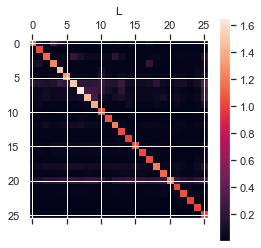

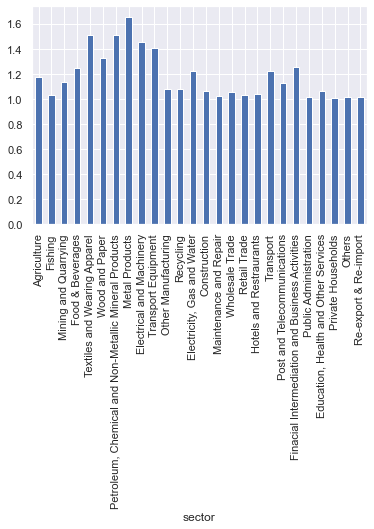

In [40]:

# visulize L
sb.set()
plt.matshow(L_sec)
plt.colorbar()
plt.title("L")
plt.show()

# bar plot of diagonal of L
dL = pd.Series(np.diag(L_sec), index = L_sec.index)
dL.plot.bar()
plt.show()




We can see that the $\mathbf{L}$ matrix is almost entirely diagonal and most diagonal elements are higher than one. This indicates that a final demand of \\$1 results in an output of at least \\$1. Anything higher than than \\$1 is the result of intermediate demand. We can also see that the off-diagonal terms are much smaller than 1 although we know that the total intermediate demand and the final demand are on average more or less the same. 

We saw earlier that most of the output from the "Construction" sector came from final demand. But what about the amount that didn't come from final demand? How can we track it? Well, we could look at the $\mathbf{L}$ matrix, but that would only show us where the money ends up. Instead we could trace it directly in terms of trade. We can visualize what the response to the final demand as a graph. Let's write some code for that. 


In [41]:
# write a function to export graph as .gexf file which can be visualized with Gephi

def write_list_of_networkX_graphs_to_gexf(graphs, timestamps, savename = "nx2gexf.gexf", write_digits = 5):
    """Write  a list of networksX graphs with weighted edges (including all edge attributes) and nodes (and node attributes) to a dynamic .gexf file.
    Each element in the list corresponds to a timestamp.
    graphs: list of networkx graphs
    timestamps: list of timestamp integers or floats.
    write_digits: number of digits to use when writing the graph to .gexf
    Returns: None
    """
    from datetime import date    
    from bs4 import BeautifulSoup as bs
        
    #initialize dictionary that links edges to timestamps and nodes to timestamps
    from collections import defaultdict    
    edge2timestamps = defaultdict(list)
    node2timestamps = defaultdict(list)
    
#    #initialize dictionaries and lists that link nodes, year and attributes
    node2deg = defaultdict(lambda: defaultdict(float)) # [label][timestamp]
    node2attr = defaultdict(lambda: defaultdict(lambda: defaultdict(float))) # [label][timestamp][attribute label] 
    
    edge2attr = defaultdict(lambda: defaultdict(lambda: defaultdict(float))) # [edge label][timestamp][attribute_label]
    
    node_attr_titles = []
    node_labels = []
    
    edge_attr_titles = []
    edge_labels = []
    
    #populate dictionaries and lists
    for n, graph_n in enumerate(graphs):

        #add edge data
        for edge in graph_n.edges:
            
            edge_labels.append(edge)
            edge2timestamps[edge].append(timestamps[n])
            
            for key in graph_n.edges[edge].keys():
        
                edge2attr[edge][timestamps[n]][key] = graph_n.edges[edge][key]
                edge_attr_titles.append(key)

        # add nodes data
        degrees = graph_n.degree(weight = "weight")
        
        for node in graph_n.nodes:
            node_labels.append(node)
            node2timestamps[node].append(timestamps[n])
            node2deg[node][timestamps[n]]=degrees[node]
            for key in graph_n.nodes[node].keys():
                node2attr[node][timestamps[n]][key] = graph_n.nodes[node][key]
                node_attr_titles.append(key)

                
    # get sorted list of unique nodes and edges
    node_labels = sorted(list(set(node_labels)))
    node_attr_titles = sorted(set(node_attr_titles))

    edge_labels = sorted(list(set(edge_labels)))
    edge_attr_titles  = sorted(set(edge_attr_titles))
    
    # create dictionary that links node to integer
    node2id = {node_n:n for n, node_n in enumerate(node_labels)}
   
    # Initialize string which will eventually be written to file
    s = "" 
    
    # add header info
    s+="""<?xml version="1.1" encoding="UTF-8"?>
<gexf xmlns="http://www.gexf.net/1.2draft" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" xsi:schemaLocation="http://www.gexf.net/1.2draft http://www.gexf.net/1.2draft/gexf.xsd" version="1.2">
\t<meta lastmodifieddate={date}>
\t\t<creator>Anders Borges</creator>
\t\t<description>A dynamic graph of the intermediate demand matrix and more from EORA26</description>
\t</meta>
\t<graph mode="dynamic" defaultedgetype="directed" timeformat="double"> \n""".format(
                        date = '"%s"'%date.today())

    # declare attributes
    s += ("""\t\t<attributes class="node" mode="dynamic">
\t\t\t<attribute id="0" title="Label" type="string"/>
\t\t\t<attribute id="wdeg" title="weighted degree" type="float"/>\n""")

    # declare node attributes iteratively
    for title in node_attr_titles:
          s += """\t\t\t<attribute id="{title}" type="float"/>\n""".format(
              title = title)
    s +="""\t\t</attributes>\n"""
    
#    declare edge attributes iteratively
    s += """\t\t<attributes class="edge" mode="dynamic">\n"""
    for title in edge_attr_titles:

        s+= """\t\t\t<attribute id="{title}" type="float"/>\n""".format(
            title = title)
    s += """\t\t</attributes>\n""" 

    #add nodes
    s+="""\t\t<nodes>\n"""

    for n, node in enumerate(node_labels):

        s+= """\t\t\t<node id="{idx}" label="{label}">\n""".format(
                                idx = node2id[node],
                                label = node)
                                          
        for n, timestamp_n in enumerate(node2timestamps[node]):

            # add weighted degree
            s+="""\t\t\t\t<attvalue for="wdeg" value="{deg_t_n}" start="{start}" end="{end}"> </attvalue>\n""" \
                .format(deg_t_n=node2deg[node][timestamp_n], 
                        start=timestamp_n, 
                        end = timestamp_n+1)

            # add other attributes 
            for attribute in sorted(list(node2attr[node][timestamp_n].keys())):
                
                s+= """\t\t\t\t<attvalue for="{attribute_title}" value="{attr_t_n}" start="{start}" end="{end}"> </attvalue>\n""" \
                .format(attribute_title=attribute, 
                        attr_t_n = node2attr[node][timestamp_n][attribute],
                        start=timestamp_n, 
                        end = timestamp_n+1)

        s+="\t\t\t</node>\n"
                                          
    s+="\t\t</nodes>\n"
    
    # add edges                                          
    s+="\t\t<edges>\n"

    for e, edge_n in enumerate(sorted(list(edge2timestamps.keys()))): 

        s+="""\t\t\t<edge source="{source_idx}" target="{target_idx}" label="{edge_label:.4f}">\n\t\t\t\t<attvalues>\n""" \
            .format(source_idx = node2id[edge_n[0]], 
                   target_idx = node2id[edge_n[1]], 
                   edge_label = edge2attr[edge_n][timestamp_n]['weight'])
                                          
        # loop over each timestamp
        for n, timestamp_n in enumerate(edge2timestamps[edge_n]):

            # loop over attributes

            for attribute in edge2attr[edge_n][timestamp_n]:
                
                s+="""\t\t\t\t\t<attvalue for="{attribute_title}" value="{attr_t_n}" start="{start}" end="{end}"> </attvalue>\n""" \
                .format(attribute_title = attribute,
                        attr_t_n = edge2attr[edge_n][timestamp_n][attribute], 
                       start="%.1f"%timestamp_n,
                        end = "%.1f"%(timestamp_n+1))
                            
        s+="\t\t\t\t</attvalues> \n \t\t\t</edge>\n"
        
    s+="\t\t</edges>\n"
        
    # tags to close graph and gexf 
    s +=("\t</graph>\n</gexf>")

    # clean indents etc.
    soup = bs(s)
    s = soup.prettify(formatter = "minimal")
    
    # write to file  gephi
    
    with open(savename, "w") as f:                                          
        f.write(s)    
                                          
    return 

def get_x(L, y):
    return L.dot(y)

def get_T(A, x):
    xhat = pd.DataFrame(np.diag(x) , index=x.index,columns=x.index) 
    return A.dot(xhat)



In [42]:
# Make graph for each sector and write to .gexf file

years = [2015]

nodes_years = {}
edges_years = {}


graphs = []
for n, year in enumerate(years):

    # load data
    eora = pymrio.parse_eora26(year=year, path=eora_storage)

    # define aggregation matrices
    N_sectors = eora.get_sectors().size
    N_countries = eora.get_regions().size
    sec_agg_matrix2 = np.eye(N_sectors, dtype = int)
    reg_agg_matrix2 = np.ones((1, N_countries), dtype = int)

    # aggregate
    eora_agg_sec = eora.aggregate(region_agg=reg_agg_matrix2, 
                          region_names = ["none", "all"],
                          sector_agg=sec_agg_matrix2, 
                          sector_names = list(eora.get_sectors()), 
                          inplace = False)
    eora_agg_sec.calc_all()

    # clean 
    T_sec=eora_agg_sec.Z["all"].loc["all"]
    T_sec_vis = T_sec.copy() # to be modified for visualization
    x_sec=eora_agg_sec.x.loc["all"]
    A_sec = eora_agg_sec.A["all"].loc["all"]
    L_sec = eora_agg_sec.L["all"].loc["all"]
    L_sec_vis = L_sec.copy() # to be modified for visualization
    Y_sec = eora_agg_sec.Y["all"].loc["all"]
    q = eora_agg_sec.Q.S.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']['all']
    
    Q =eora_agg_sec.Q.F.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']['all']

    # define diagonal matrix, each column corresponds to a sector
    y_diag = pd.DataFrame(np.identity(x_sec.shape[0]), index = x_sec.index, columns = x_sec.index)
    
    Ly = L_sec.dot(y_diag)

    # set the diagonals to be roughly zero to be able to identify effects between sectors (only for visualisation)
    for n in range(T_sec_vis.shape[0]): # NOT elegant
        L_sec_vis.iloc[n, n] = 10**(-8) 

    G_L = nx.from_pandas_adjacency(L_sec_vis.T,create_using=nx.DiGraph)

    write_list_of_networkX_graphs_to_gexf([G_L], years, savename= "G_L_%d.gexf"%year)

    # Add info about response of edges and nodes to perturbation
    
    # calculate response for each sector
    for y_pert in y_diag:

        # calculate x for new y
        x_pert = get_x(L_sec, y_diag[y_pert])
        
        # get xhat
        xhat_pert = pd.DataFrame(np.diag(x_pert), index = x_pert.index, columns = x_pert.index)
        
        # calculate perturbed T
        T_pert = A_sec.dot(xhat_pert)

        # add final demand (y) to data frame
        adj_sec = T_pert

        # add corresponding edge info
        G_dummy = nx.from_pandas_adjacency(adj_sec.T,create_using=nx.DiGraph)


        # add info about output and footprint

        for n, node in enumerate(G_dummy.nodes()):
            G_dummy.nodes[node]["int_output_pert_%s"%(y_pert)] = T_pert.sum(axis=1)[node]
            G_dummy.nodes[node]["indirect_footprint_pert_%s"%(y_pert)] = q[n]*Ly[y_pert][node] - q[n]*y_diag[y_pert][n]
        
        
        write_list_of_networkX_graphs_to_gexf([G_dummy], years, savename= "x_y_T_files/%s.gexf"%y_pert)
            

    # calculate graphs that show the trade that results in emission for each sector
    for y_pert in y_diag:

        # calculate x for new y
        x_pert = get_x(L_sec, y_diag[y_pert])
        
        # get xhat
        xhat_pert = pd.DataFrame(np.diag(x_pert), index = x_pert.index, columns = x_pert.index)
        
        # calculate perturbed T
        T_pert = A_sec.dot(xhat_pert)

        # add final demand (y) to data frame
        adj_sec = T_pert

        # add corresponding edge info
        G_dummy = nx.from_pandas_adjacency(adj_sec.T,create_using=nx.DiGraph)

        # add info about output and footprint

        for n, node in enumerate(G_dummy.nodes()):
            G_dummy.nodes[node]["int_output_pert_%s"%(y_pert)] = T_pert.sum(axis=1)[node]
            G_dummy.nodes[node]["indirect_footprint_pert_%s"%(y_pert)] = q[n]*Ly[y_pert][node] - q[n]*y_diag[y_pert][n]
        
        
        write_list_of_networkX_graphs_to_gexf([G_dummy], years, savename= "x_y_T_files/%s.gexf"%y_pert)            
            




{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



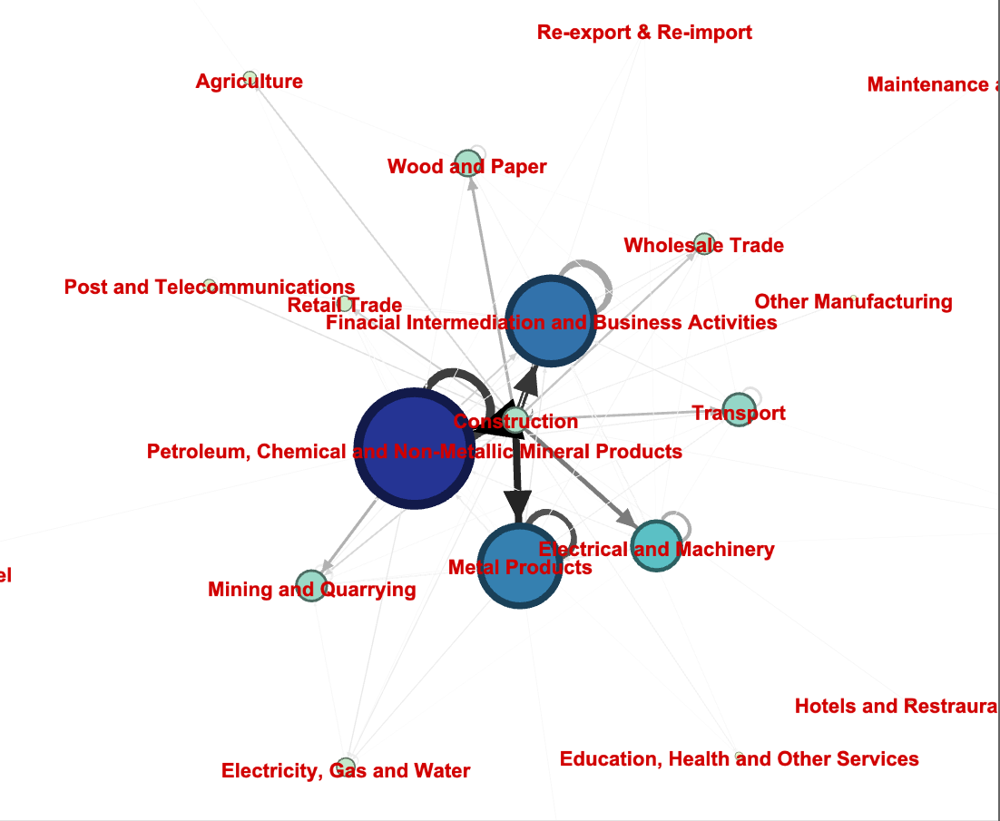

In [43]:
display(Image(filename='x_y_T_files/2015_Induced_x_Construction.png'))



In this visualization we have plotted the response of the economy to the final demand of \\$1 from the "Construction" sector. Each sector is plotted as a dot. The color and size of each dot corresponds to the intermediate output of the sector - in other words, the output generated as response to the final demand.

The dots are connected by arrows - some of them even loop onto themselves. Each arrow corresponds to the necessary trade between the sectors in order to produce the intermediate output. So the response of \\$1 of final demand is intermediate demand. We can see that the "Construction" sector primarily needs output from the "Petroleum,...", "Metal Products" and "Financial ..." sectors. But these sectors in turn need input from all the other sectors. This visualization basically visualizes the entire supply chain for the "Construction" sector. This is a powerful demonstration of how final demand shapes the economy. 

This approach can also be used to account for other things than output. We can choose to relate the output of each sector to its footprint. If we know the total emission of each sector as well as its output we can calculate the response in emission from a final demand. This is our next endeavour. First we explore the relationship between output and emission. 



<Figure size 432x288 with 0 Axes>

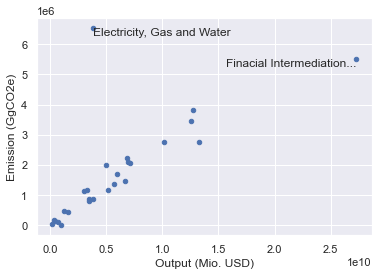

In [44]:
# Collect data
emissions = pd.DataFrame()
emissions["Emission (2015)"] = Q 
emissions["Footprint (2015)"] = D_cba
emissions["Emission/output (2015)"] = q
emissions["Output (2015)"] = x_sec
# create bar chart
fig = plt.figure()

ax = emissions.plot.scatter(x = "Output (2015)" , y ="Emission (2015)")

ax.set_xlabel('Output (Mio. USD)')
ax.set_ylabel('Emission (GgCO2e)')

# label outliers 
for i, point in emissions.iterrows():

    if point["Emission (2015)"] > 6*10**6:
        ax.text(point["Output (2015)"], point["Emission (2015)"], str(point.name), horizontalalignment='left', verticalalignment = 'top')
    if point["Emission (2015)"] < 6*10**6 and point["Emission (2015)"] > 4*10**6:
        ax.text(point["Output (2015)"], point["Emission (2015)"], str(point.name)[:23]+"...", horizontalalignment='right', verticalalignment = 'top')

plt.savefig('scatter_2015.png')
plt.show()



We can see that there is roughly a linear relationship between the output and the emission. But there is a very clear outlier, which is the "Electricity, Gas and Water" sector. For this particular sector, the emission/output is uniquely very high. So any sector that relies heavily on the "Electricity, Gas and Water" in the supply chain will leave a large footprint. If we return to the visualization of the supply chain of for the construction business, we can choose to change the size of the dots to reflect the footprint corresponding to the output of each industry. 

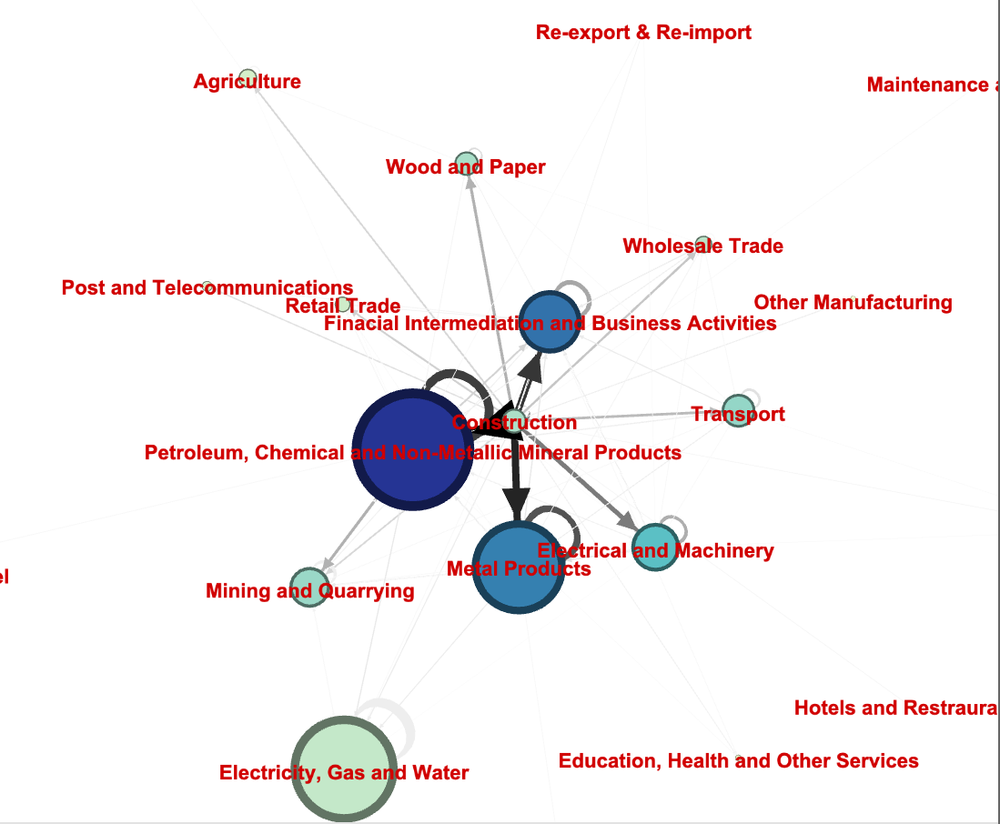

In [45]:
display(Image(filename='x_y_T_files/2015_Induced_x+footprint_Construction.png'))


We can see that the sector "Electricity, Gas and Water" is the second largest contributor to the indirect footprint although the corresponding indirect output is tiny. This is despite the fact that the intermediate trade is quite low. This demonstrates very clearly where the hotspots of the supply chain is. In this case it makes sense to look at both the direct consumption from "Electricity, Gas and Water" but perhaps even more at the indirect consumption from further down the supply chain. 

Okay, time to switch perspective. Let's try to look at the emission from the perspective of regions instead of sectors. 

## Visualizing global emission 

Understanding what the different properties are:

In [46]:
# Getting extension: 
print(eora_agg.get_Y_categories())
eora_agg.calc_all()

# factor of production matrix (F)/satellite accounts (Q) 
eora_agg.Q.F

# factor of production coefficients (S): F*(xhat)^-1
eora_agg.Q.S
#interpret S as the "recipe" to produce 1$ worth of output from the satellite accounts

# Multipliers for one unit of output is:
eora_agg.Q.M # M = S L  or m = qL in other notation 

# Total requirements (footprints for environmental requirements)
# D_cba = M y  or #qx = qLy
eora_agg.Q.D_cba#.loc[('GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHGAR4|TOTALexcludingLULUCF|GgCO2eq')]





Index(['Household final consumption P.3h',
       'Non-profit institutions serving households P.3n',
       'Government final consumption P.3g',
       'Gross fixed capital formation P.51', 'Changes in inventories P.52',
       'Acquisitions less disposals of valuables P.53'],
      dtype='object', name='category')


region                                                                               AFG  \
sector                                                                              none   
stressor                         source                                                    
Energy Usage                     Natural Gas                                         0.0   
                                 Coal                                                0.0   
                                 Petroleum                                           0.0   
                                 Nuclear Electricity                                 0.0   
                                 Hydroelectric Electricity                           0.0   
...                                                                                  ...   
IEA GHG emissions and energy use IEA - DEPRECATED - GDP using purchasing power p...  0.0   
                                 IEA - DEPRECATED - GDP using exchange rates         0.0   
                                 IEA - DEPRECATED - Population                       0.0   
                                 IEA - DEPRECATED - Total primary energy supply ...  0.0   
                                 IEA - DEPRECATED - Total primary energy supply ...  0.0   

region                                                                                             \
sector                                                                                        all   
stressor                         source                                                             
Energy Usage                     Natural Gas                                         11297.533429   
                                 Coal                                                 8563.951717   
                                 Petroleum                                           10108.358777   
                                 Nuclear Electricity                                   966.800336   
                                 Hydroelectric Electricity                             782.380213   
...                                                                                           ...   
IEA GHG emissions and energy use IEA - DEPRECATED - GDP using purchasing power p...      0.000000   
                                 IEA - DEPRECATED - GDP using exchange rates             0.000000   
                                 IEA - DEPRECATED - Population                           0.000000   
                                 IEA - DEPRECATED - Total primary energy supply ...      0.000000   
                                 IEA - DEPRECATED - Total primary energy supply ...      0.000000   

region                                                                               ALB  \
sector                                                                              none   
stressor                         source                                                    
Energy Usage                     Natural Gas                                         0.0   
                                 Coal                                                0.0   
                                 Petroleum                                           0.0   
                                 Nuclear Electricity                                 0.0   
                                 Hydroelectric Electricity                           0.0   
...                                                                                  ...   
IEA GHG emissions and energy use IEA - DEPRECATED - GDP using purchasing power p...  0.0   
                                 IEA - DEPRECATED - GDP using exchange rates         0.0   
                                 IEA - DEPRECATED - Population                       0.0   
                                 IEA - DEPRECATED - Total primary energy supply ...  0.0   
                                 IEA - DEPRECATED - Total primary energy supply ...  0.0   

region 

In [47]:
# Grab emission data and populate DataFrame

years = range(1993, 2016)

Q_vis = pd.DataFrame( columns=["Territorial Emission", "Norm. territorial emission, %", "Year", "Footprint, GgCO2e", "Footprint/Territorial Emission, GgCO2eq", "Local contribution to footprint"])

eora_names = []

for n, year in enumerate(years):
    print(n, year)
    eora = pymrio.parse_eora26(year=year, path=eora_storage)
    N_sectors = eora.get_sectors().size
    N_countries = eora.get_regions().size
   # define concordance matrix 
    sec_agg_matrix = np.ones(( 1, N_sectors), dtype = int)
    reg_agg_matrix = np.eye( N_countries, dtype = int)
    # aggregate
    eora_agg = eora.aggregate(region_agg=reg_agg_matrix, 
                              region_names = list(eora.get_regions()),
                              sector_agg=sec_agg_matrix, 
                              sector_names = ["none", "all"], 
                              inplace = False)
    eora_agg.calc_all()

    # Local emission: factor of production matrix (F)/satellite accounts (Q) 
    Q = eora_agg.Q.F.T.xs('all', level = "sector").T    
    Q_emission = Q.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']

    Q1 = pd.DataFrame({"Territorial Emission":Q_emission, "Norm. territorial emission, %": Q_emission/Q_emission.sum()*100})

    # add names to list
    eora_names+=Q1.index.tolist()
    
    Q1["Year"] = year
    
    # Consumption based emission
    D = eora_agg.Q.D_cba.T.xs('all', level = "sector").T
    D_emission = D.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']
    Q1["Footprint, GgCO2e"] = D_emission 
#    Q1["Norm. footprint, GgCO2e"] = D_emission/(D_emission.sum()*100)
    

    # Ratio of footprint and territorial emission:
    Q1["Footprint/Territorial Emission, GgCO2eq"] = Q1["Footprint, GgCO2e"]/Q1["Territorial Emission"]

    # Local contribution to emission
    L_reg = eora_agg.L.iloc[1::2, 1::2].droplevel(level=1)
    L_reg.columns = L_reg.columns.droplevel(level =1)
    Y_reg = eora_agg.Y.xs('all', level = 1)#["all"].loc["all"]

    # x = L y = L_11*y_1+L12*y_2+ ... 
    x_tilde = Y_reg.sum(axis=1) * pd.Series(np.diag(L_reg), index = Y_reg.index)
    
    
    q =eora_agg.Q.S.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq'].xs('all', level=1)    
    
    Q1["Local contribution to footprint"] = x_tilde*q
    
    
    Q_vis = pd.concat([Q_vis, Q1]) 

# convert bad names to correct iso3 standard
eora_names[:] = [x if x != 'SUD' else 'SDN' for x in eora_names]
eora_names[:] = [x if x != 'SDS' else 'SSD' for x in eora_names]

Q_vis["iso3"] = coco.convert(names = eora_names, to='iso3')

Q_vis["Region"] = coco.convert(names = eora_names, to='name_short')
Q_vis.reset_index()
    
    
    

0 1993
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



1 1994
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



2 1995
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



3 1996
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



4 1997
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



5 1998
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



6 1999
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



7 2000
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



8 2001
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



9 2002
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



10 2003
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



11 2004
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



12 2005
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



13 2006
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



14 2007
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



15 2008
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



16 2009
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



17 2010
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



18 2011
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



19 2012
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



20 2013
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



21 2014
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



22 2015
{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



,index,Territorial Emission,"Norm. territorial emission, %",Year,"Footprint, GgCO2e","Footprint/Territorial Emission, GgCO2eq",Local contribution to footprint,iso3,Region
0,AFG,11100.0000,0.035985,1993,11664.006286,1.050811,10777.184910,AFG,Afghanistan
1,ALB,5700.0000,0.018479,1993,6459.771750,1.133293,5459.843249,ALB,Albania
2,DZA,179000.0000,0.580303,1993,159423.840341,0.890636,154194.447112,DZA,Algeria
3,AND,505.0000,0.001637,1993,776.332214,1.537292,484.669381,AND,Andorra
4,AGO,68200.0000,0.221099,1993,60954.611886,0.893763,58627.226928,AGO,Angola
...,...,...,...,...,...,...,...,...,...
4342,VEN,260999.9550,0.576147,2015,218539.518152,0.837316,202063.058740,VEN,Venezuela
4343,VNM,327999.8804,0.724047,2015,315651.166009,0.962351,288850.774866,VNM,Vietnam
4344,YEM,42500.0000,0.093817,2015,42800.393299,1.007068,38080.267188,YEM,Yemen
4345,ZMB,39100.0000,0.086312,2015,37309.104094,0.954197,34284.418342,ZMB,Zambia


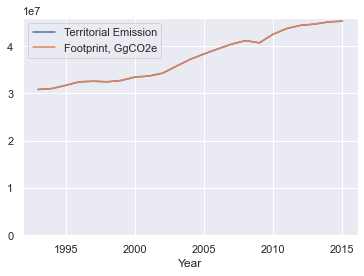

In [48]:
# plot total emission 
Q_vis.groupby(["Year"]).sum()[["Territorial Emission","Footprint, GgCO2e" ]].plot()
plt.ylim([0, 4.6*10**7])
plt.show()


Luckily, the two methods of calculating the total emission is the same. We can see that global emission increases. There was a drop in emissions in 2009, likely due to reduced economical activity due to the financial crisis. 

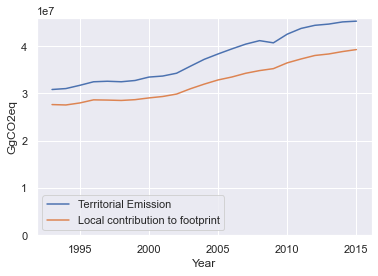

In [49]:
# plot total emission 
Q_vis.groupby(["Year"]).sum()[["Territorial Emission","Local contribution to footprint" ]].plot()
plt.ylim([0, 4.6*10**7])
plt.ylabel('GgCO2eq')
plt.savefig('emission.png')
plt.show()

(0.0, 16.9236379668567)

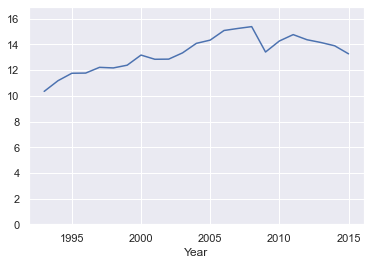

In [50]:
t = Q_vis.groupby(["Year"]).sum()[["Territorial Emission","Local contribution to footprint" ]]
t["Ratio exported (%)"] =100-t["Local contribution to footprint"]/t["Territorial Emission"]*100
t["Ratio exported (%)"].plot()
plt.ylim([0, t["Ratio exported (%)"].max()*1.1])

We can see that the contribution to the rangesfrom 10 to 15 %.

In [52]:
# plot territorial emission 
fig = px.choropleth(Q_vis, locations="iso3",
                    color='Territorial Emission', # lifeExp is a column of gapminder
                    hover_name='Region', # column to add to hover information
                   animation_frame ='Year',
                   projection="natural earth",
                    range_color = [0,Q_vis["Territorial Emission"].max()],
                   color_continuous_scale = "deep", 
                    width = 900, 
                    height = 600,
                    
                    title = 'Territorial Emission, GgCO2e (GgCO2e, excluding LULUFC)'
)
fig.show()



The biggest single contributors to emission are the US, China, India and Russia. The EU is likely also a large contributor but it is difficult to see on the map since the emission of each country is shown. We see that the terriotorial emission from China tripples over the period 1993 to 2015 and is the single largest emitter. But how does the territorial emission compare to the footprint?

In [54]:
# plot consumption-based emission 
fig = px.choropleth(Q_vis, locations="iso3",
                    color="Footprint, GgCO2e", # lifeExp is a column of gapminder
                    hover_name='Region', # column to add to hover information
                   animation_frame ='Year',
                   projection="natural earth",
                    range_color = [0,Q_vis["Footprint, GgCO2e"].max()],
                   color_continuous_scale = "deep", 
                    width = 900, 
                    height = 600,
                    
                    title = 'Footprint (GgCO2e, excluding LULUFC)'
)
fig.show()

In [55]:
Q_vis.sort_values(by= "Footprint, GgCO2e", ascending = False)

,Territorial Emission,"Norm. territorial emission, %",Year,"Footprint, GgCO2e","Footprint/Territorial Emission, GgCO2eq",Local contribution to footprint,iso3,Region
CHN,12400010.16,27.372538,2015,1.072077e+07,0.864577,1.106044e+07,CHN,China
CHN,12400008.18,27.468413,2014,1.066682e+07,0.860227,1.098836e+07,CHN,China
CHN,12300000.98,27.526789,2013,1.055661e+07,0.858261,1.090760e+07,CHN,China
CHN,12200013.12,27.462287,2012,1.029173e+07,0.843584,1.072833e+07,CHN,China
CHN,11800007.41,26.961746,2011,9.855476e+06,0.835209,1.030078e+07,CHN,China
...,...,...,...,...,...,...,...,...
SUD,0.00,0.000000,1998,2.739601e+01,inf,0.000000e+00,SDN,Sudan
SUD,0.00,0.000000,1999,2.713231e+01,inf,0.000000e+00,SDN,Sudan
SDS,0.00,0.000000,2000,2.615902e+01,inf,0.000000e+00,SSD,South Sudan
USR,0.00,0.000000,2000,2.615851e+01,inf,0.000000e+00,not found,not found


We can see that China has a smaller footprint than its terriotorial emission. Countries like the US however have a larger footprint that territorial emission. Let's see how this compares to the rest of the world by plotting the ratio of the footprint and the terriotorial emissions. 

In [58]:
# plot emission import 

maxi =2
mini = Q_vis["Footprint/Territorial Emission, GgCO2eq"].min()
display(Q_vis[Q_vis["Footprint/Territorial Emission, GgCO2eq"].isna()])


fig = px.choropleth(Q_vis, locations="iso3",
                    color="Footprint/Territorial Emission, GgCO2eq", # lifeExp is a column of gapminder
                    hover_name='Region', # column to add to hover information
                    animation_frame ='Year',
                    projection="natural earth",
                    range_color = [0.5, 1.5],
                    color_continuous_scale = "RdBu", 
                    width = 900, 
                    height = 600,
                    hover_data = ["Footprint, GgCO2e","Territorial Emission" ],
                    title = "Ratio of footprint and territorial emission (excluding LULUCF), GgCO2e"
)
fig.show()


,Territorial Emission,"Norm. territorial emission, %",Year,"Footprint, GgCO2e","Footprint/Territorial Emission, GgCO2eq",Local contribution to footprint,iso3,Region


We can see that most of Asia (except Japan) has consistently had a lower footprint than territorial emission while the opposite of true for most of Europe and the US. There appears to be many interesting dynamics going on (especially in Africa, South America and east/west Europe) but the general trend is that the map gets more colorful throughout the time-span. This indicates a polarization: importing products exports the emission. This is quite interesting but the map doesn't tell us the full story. For example, from where is China "importing" it's emission? We can get a good hint from looking at the trade, but we can do better than that. We can quantify it and visualize it in the same manner as we did for the global aggregated sectors. 

In [60]:
# Make graphs for each region and write to files 

years = list(range(1993, 2016)) # 1989 is a dummy year which is identical to 2015!!

nodes_years = {}
edges_years = {}

# L graphs
G_Ls = []

# qLy graphs
G_qLys = []

# regions to produce supply chains for
reg_suppl = ["CHN", "USA", "DNK", "DEU", "GBR", "NOR", "JPN"]

reg_suppl_dict = {reg:[] for reg in reg_suppl}

for n, year in enumerate(years):

#    print(n, year)
    
    eora = pymrio.parse_eora26(year=year, path=eora_storage)
    N_sectors = eora.get_sectors().size
    N_countries = eora.get_regions().size
    # define concordance matrix 
    sec_agg_matrix = np.ones(( 1, N_sectors), dtype = int)
    reg_agg_matrix = np.eye( N_countries, dtype = int)
    # aggregate
    eora_agg = eora.aggregate(region_agg=reg_agg_matrix, 
                              region_names = list(eora.get_regions()),
                              sector_agg=sec_agg_matrix, 
                              sector_names = ["none", "all"], 
                              inplace = False)
    
    eora_agg.calc_all()


    T_agg = eora_agg.Z.iloc[1::2, 1::2].droplevel(level=1)
    T_agg.columns = T_agg.columns.droplevel(level =1)
    
    T_reg_vis = T_agg.copy() # to be modified for visualization
    
    x_reg=eora_agg.x.xs('all', level =1)
    x_reg = x_reg.rename(columns= {"indout": "Total output"}) 

    A_reg = eora_agg.A.iloc[1::2, 1::2].droplevel(level=1)
    A_reg.columns = A_reg.columns.droplevel(level =1)

    L_reg = eora_agg.L.iloc[1::2, 1::2].droplevel(level=1)
    L_reg.columns = L_reg.columns.droplevel(level =1)
    L_reg_vis = L_reg.copy() # to be modified for visualization
    
    Y_reg = eora_agg.Y.xs('all', level = 1)#["all"].loc["all"]

    q =eora_agg.Q.S.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq'].xs('all', level=1)    
    
    Q = eora_agg.Q.F.T.xs('all', level = "sector")
    Q = Q.T.loc['GHG emissions from PRIMAPHIST', 'PRIMAP|KYOTOGHG|TOTALexcludingLULUCF|GgCO2eq']

    # get data from year
    Q_vis_year = Q_vis[Q_vis["Year"]==year]
    node_sizes =Q_vis_year["Footprint, GgCO2e"]-Q_vis_year["Territorial Emission"]

    # set a NA value to balance color scheme in Gephi
    # find sign of largest element in node_sizes
    maxi = node_sizes.abs().idxmax()
    
    node_sizes["USR"] = - node_sizes[maxi] #USR is the least important
    
    node_sizes.fillna(0)

    # create graph of L
    # set the diagonals to be roughly zero to be able to identify effects between sectors (only for visualisation)
    for m in range(L_reg_vis.shape[0]): # NOT elegant
        L_reg_vis.iloc[m, m] = 10**(-8) 

    G_L = nx.from_pandas_adjacency(L_reg_vis.T , create_using=nx.DiGraph)

    # define diagonal matrix, each column corresponds to a region
    y_unit = pd.DataFrame(np.identity(x_reg.shape[0]), index = x_reg.index, columns = x_reg.index)
    

    # calculate output for one unit of final demand (y)
    Ly_unit = L_reg.dot(y_unit)
    
    for node in G_L.nodes():
        G_L.nodes[node]["total_output_%d"%(year)] = x_reg['Total output'][node]
        G_L.nodes[node]["total_footprint_%s"%(year)] = q[node]*Ly_unit[node]

    G_Ls.append(G_L)

    # create graph where each edge is a term in the matrix produdt qLy

    qLy = np.dot(np.diag(q), np.dot(L_reg, np.diag(Y_reg.sum(axis=1))))
    qLy = pd.DataFrame(qLy, index = L_reg.index, columns = L_reg.index)

    # remove diagonal terms
    for m in range(qLy.shape[0]): # NOT elegant
        qLy.iloc[m, m] = 0.0

#    qLy/= qLy.to_numpy().sum() #normalize 
    
    G_qLy = nx.from_pandas_adjacency(qLy.T , create_using=nx.DiGraph)
    
    # add info about output and footprint
    nx.set_node_attributes(G_qLy, Q, "Territorial emission")
    #nx.set_node_attributes(G_qLy, x_reg["Total output"])
    nx.set_node_attributes(G_qLy, node_sizes.abs(), "size Footprint-territorial emission")
    nx.set_node_attributes(G_qLy, node_sizes, "color Footprint-territorial emission")
    
    G_qLys.append(G_qLy)

    # Add graphs that visualize response of system
    
    # calculate response for each sector easier interpretation 
    for y_pert in y_unit:
        if y_pert not in reg_suppl:
            continue
        # calculate x for new y
        x_pert = get_x(L_reg, y_unit[y_pert])
#        print(x_pert)
        # get xhat
        xhat_pert = pd.DataFrame(np.diag(x_pert), index = x_pert.index, columns = x_pert.index)
        
        # calculate perturbed T
        T_pert = A_reg.dot(xhat_pert)
        

        adj_reg = T_pert
        
        G_dummy = nx.from_pandas_adjacency(adj_reg.T,create_using=nx.DiGraph)
        
        # add info about output and footprint
#        display(T_pert)
        for n, node in enumerate(G_dummy.nodes()):
            G_dummy.nodes[node]["int_output_pert_%s"%(y_pert)] = T_pert.sum(axis=1)[node]
            G_dummy.nodes[node]["indirect_footprint_pert_%s"%(y_pert)] = q[n]*Ly_unit[y_pert][node] - q[n]*y_unit[y_pert][n]
        
        reg_suppl_dict[y_pert].append(G_dummy)
        

write_list_of_networkX_graphs_to_gexf( G_qLys , years, savename= "G_qLy_reg_1993_2015.gexf")

#for key in reg_suppl_dict.keys():
#    write_list_of_networkX_graphs_to_gexf(reg_suppl_dict[key], years, savename= "x_y_T_regions_files/%s.gexf"%key)



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



{'Z': header(index='labels_Z', columns='labels_Z', index_names=['region', 'sector'], column_names=['region', 'sector']), 'Q': header(index='labels_Q', columns='labels_Z', index_names=['stressor', 'source'], column_names=['region', 'sector']), 'QY': header(index='labels_Q', columns='labels_Y', index_names=['stressor', 'source'], column_names=['region', 'category']), 'VA': header(index='labels_VA', columns='labels_Z', index_names=['inputtype', 'category'], column_names=['region', 'sector']), 'Y': header(index='labels_Z', columns='labels_Y', index_names=['region', 'sector'], column_names=['region', 'category'])}


/Users/andersborges/opt/anaconda3/envs/mrio/lib/python3.8/site-packages/pandas/core/generic.py:3889: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



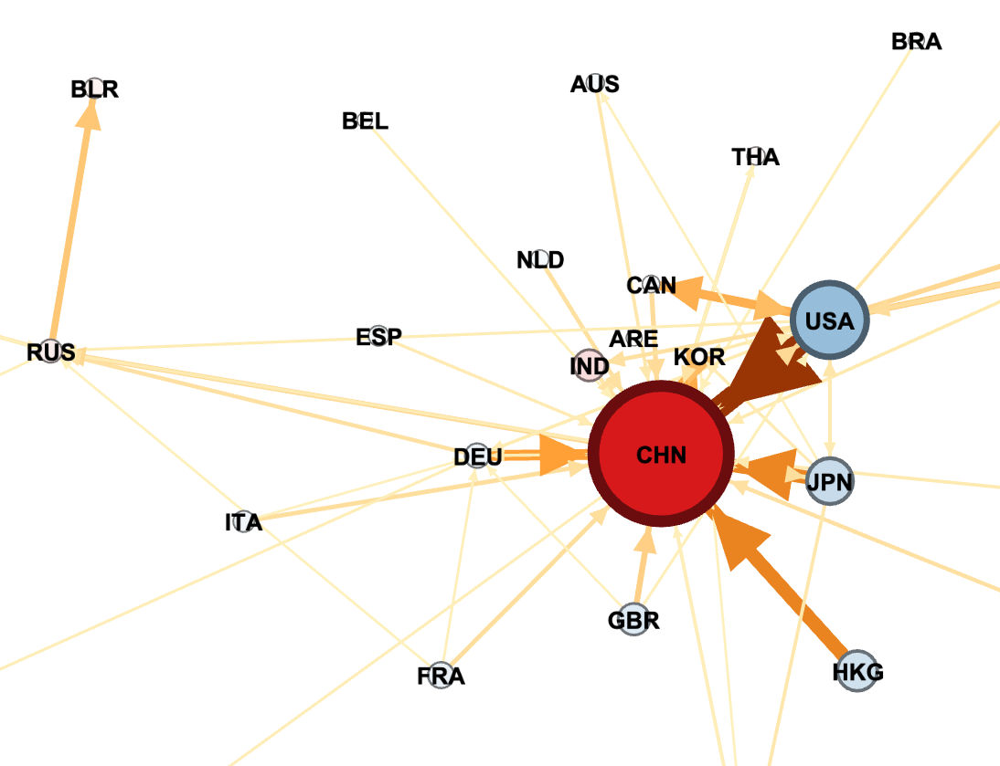

In [61]:
display(Image(filename='qLy_2015.png'))

